## Thêm thư viện

In [1]:
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc

## K-means clustering for image segmentation with color quantization

Ảnh ban đầu 

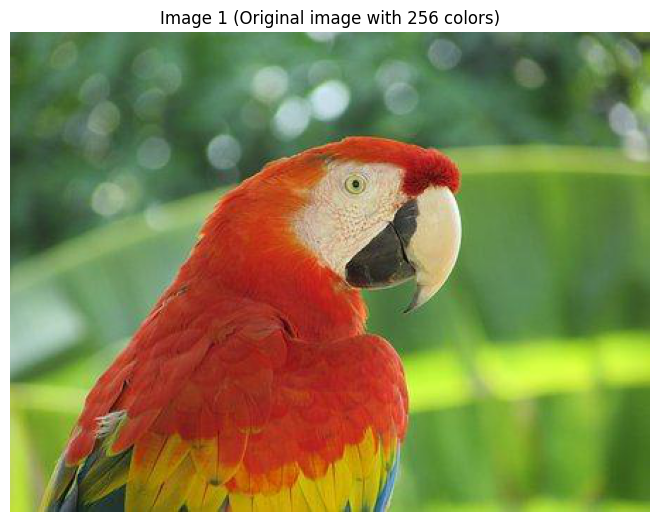

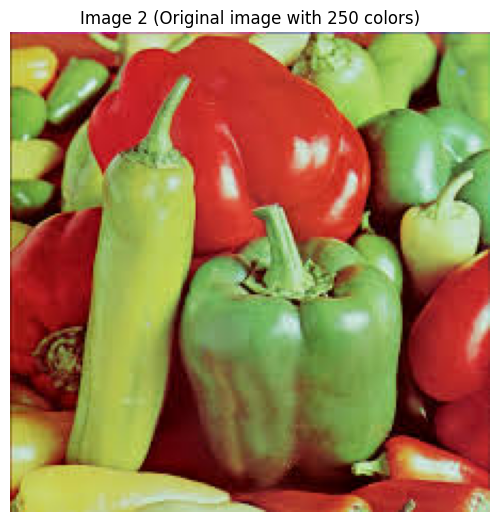

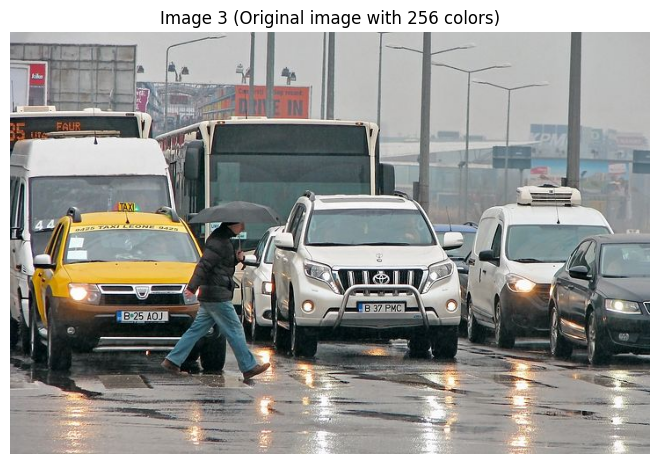

In [2]:
from PIL import Image
import matplotlib.pyplot as plt

# Đường dẫn đến bức ảnh đầu tiên
img_paths = ["../images/parrot.png", "../images/pepper.jpg", "../images/cars.jpg"]
imgs = [Image.open(path) for path in img_paths]

# Display the additional images
for i, image in enumerate(imgs):
    plt.figure(i + 2), plt.clf()
    ax = plt.axes([0, 0, 1, 1])
    plt.axis('off')
    plt.title(f'Image {i + 1} (Original image with {len(np.unique(image))} colors)')
    plt.imshow(image)

Ảnh sau xử lý 

done in 0.135s.
Predicting color indices on the full image (k-means)
done in 0.000s.
done in 0.054s.
Predicting color indices on the full image (k-means)
done in 0.005s.
done in 0.018s.
Predicting color indices on the full image (k-means)
done in 0.000s.
done in 0.016s.
Predicting color indices on the full image (k-means)
done in 0.014s.


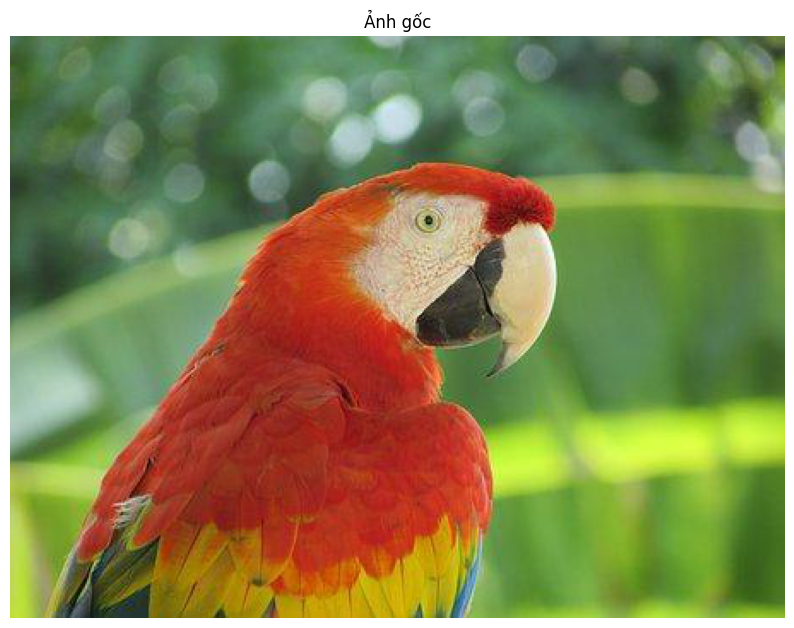

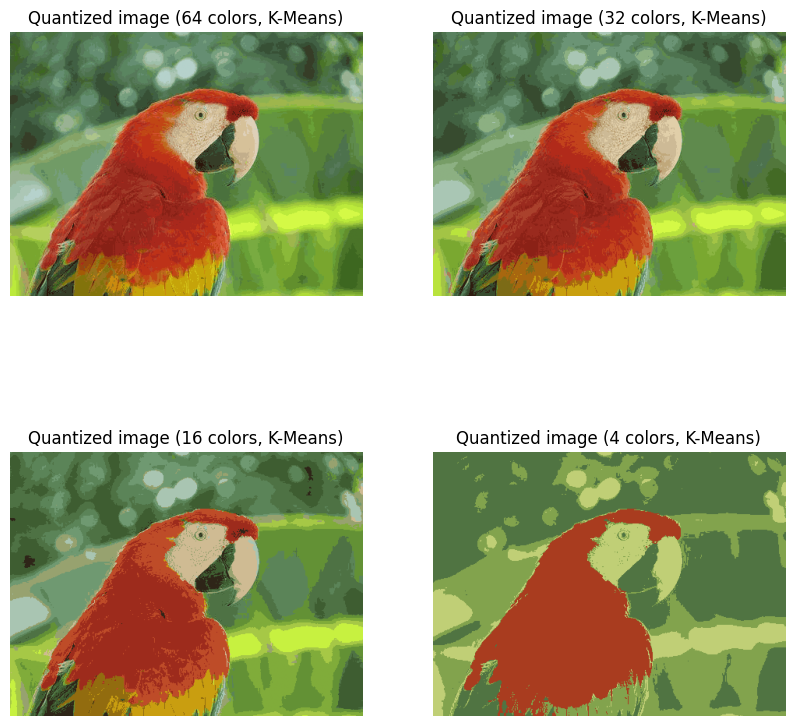

Predicting color indices on the full image (random)
done in 0.024s.
Predicting color indices on the full image (random)
done in 0.000s.
Predicting color indices on the full image (random)
done in 0.015s.
Predicting color indices on the full image (random)
done in 0.017s.


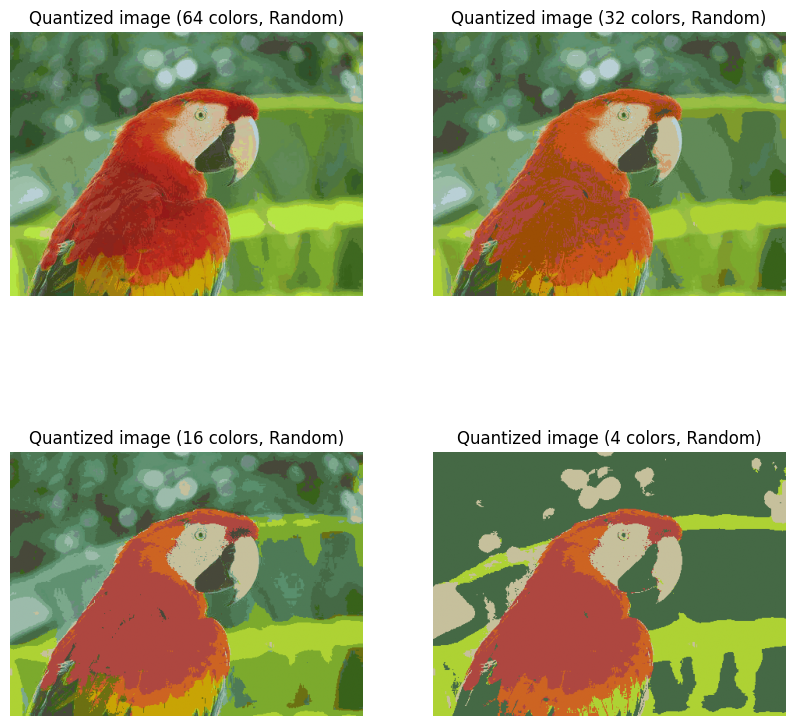

done in 0.034s.
Predicting color indices on the full image (k-means)
done in 0.005s.
done in 0.163s.
Predicting color indices on the full image (k-means)
done in 0.005s.
done in 0.019s.
Predicting color indices on the full image (k-means)
done in 0.002s.
done in 0.018s.
Predicting color indices on the full image (k-means)
done in 0.004s.


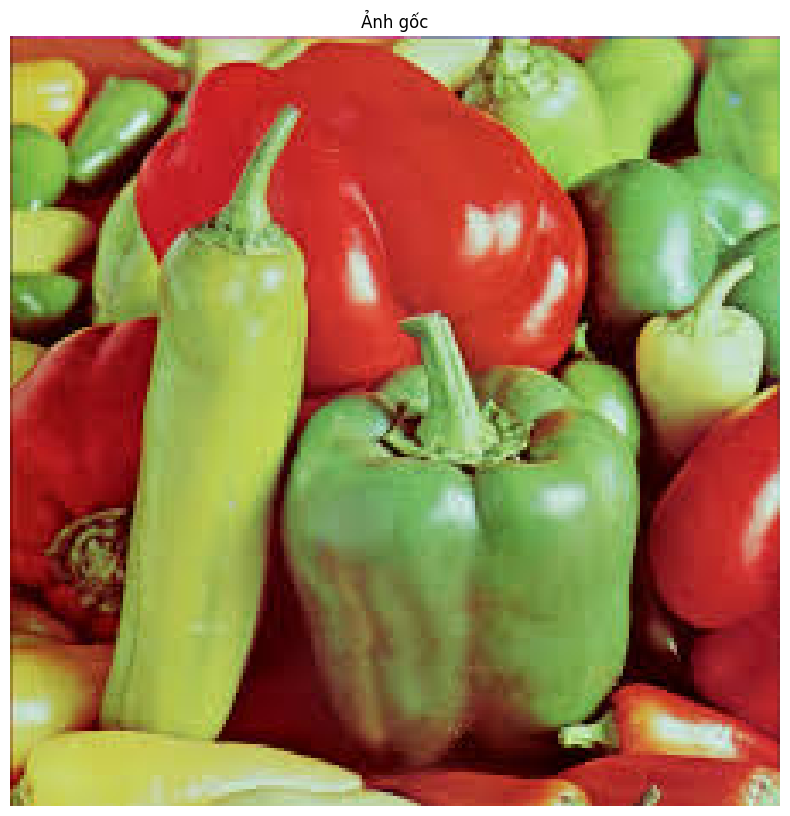

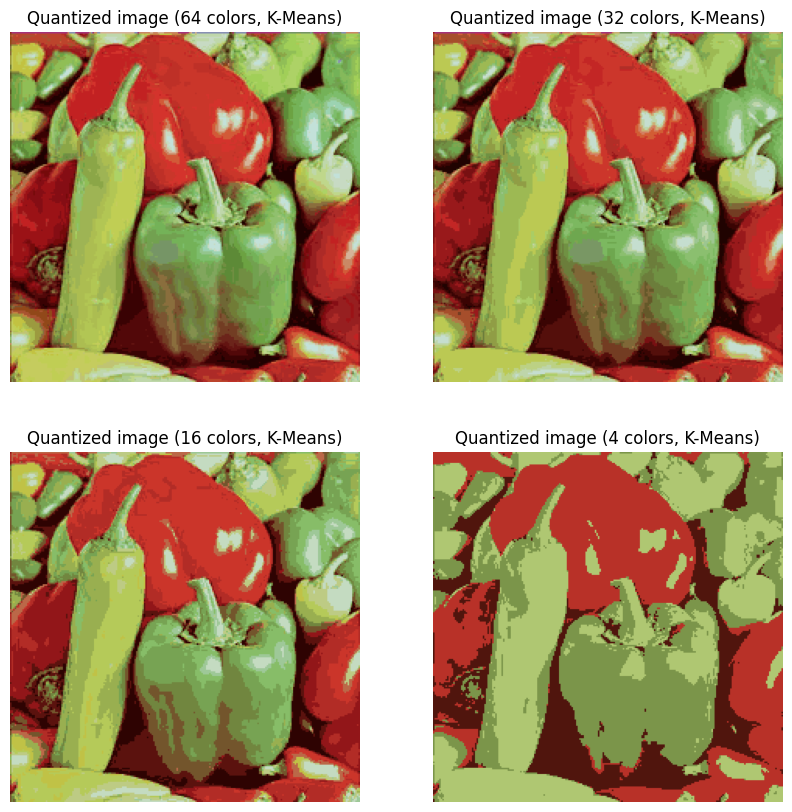

Predicting color indices on the full image (random)
done in 0.013s.
Predicting color indices on the full image (random)
done in 0.000s.
Predicting color indices on the full image (random)
done in 0.004s.
Predicting color indices on the full image (random)
done in 0.003s.


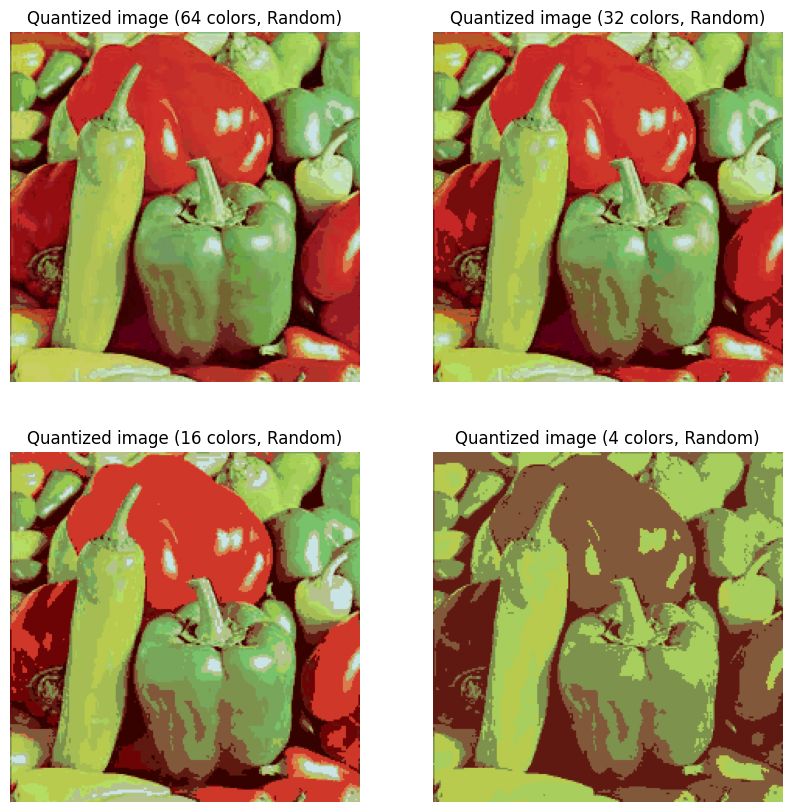

done in 0.053s.
Predicting color indices on the full image (k-means)
done in 0.017s.
done in 0.091s.
Predicting color indices on the full image (k-means)
done in 0.029s.
done in 0.032s.
Predicting color indices on the full image (k-means)
done in 0.015s.
done in 0.034s.
Predicting color indices on the full image (k-means)
done in 0.005s.


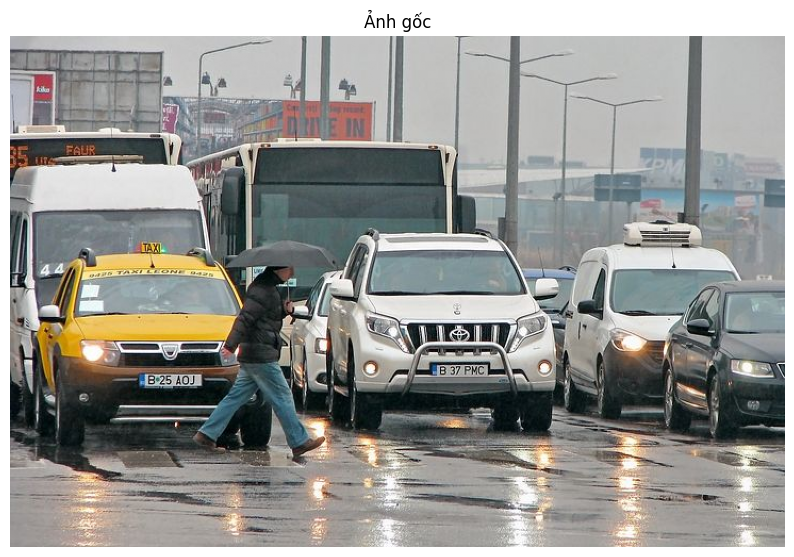

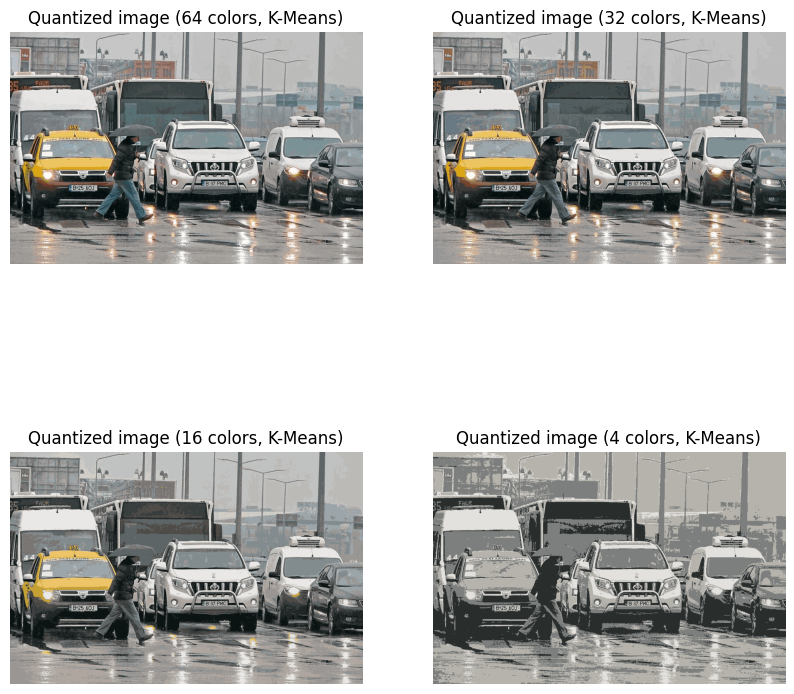

Predicting color indices on the full image (random)
done in 0.069s.
Predicting color indices on the full image (random)
done in 0.033s.
Predicting color indices on the full image (random)
done in 0.015s.
Predicting color indices on the full image (random)
done in 0.017s.


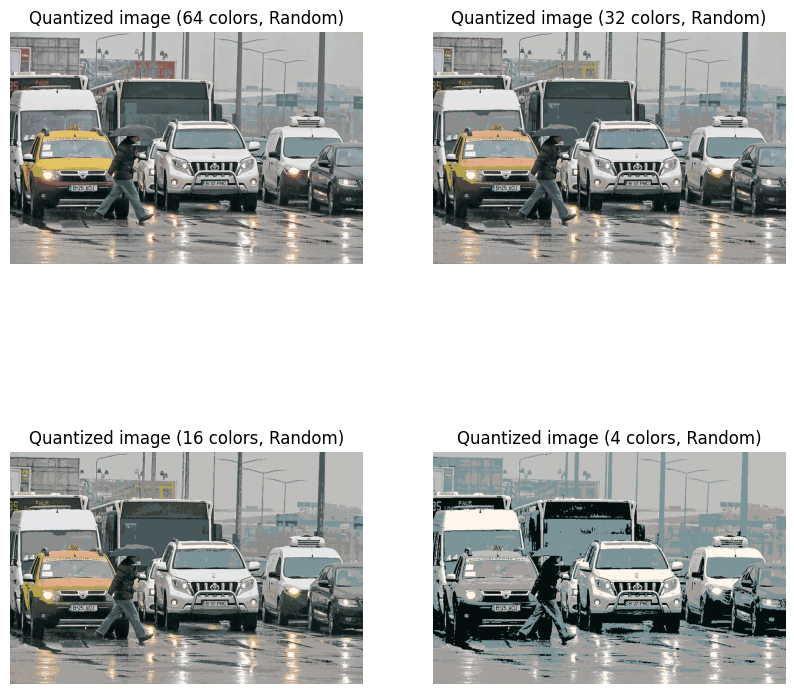

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.utils import shuffle
from sklearn.metrics import pairwise_distances_argmin
from PIL import Image
import time

# Đường dẫn đến ảnh đầu vào
img_paths = ["../images/parrot.png", "../images/pepper.jpg", "../images/cars.jpg"]
imgs = [Image.open(path) for path in img_paths]

# Display the additional images
for i, image in enumerate(imgs):
# Mở và chuyển ảnh sang dạng float để thực hiện việc lượng tử hóa màu
    image = np.array(image, dtype=np.float64) / 255  # Chuyển đổi thành dạng float trong khoảng [0, 1]

    # Lấy kích thước ảnh và chuyển đổi thành mảng 2D
    w, h, d = original_shape = tuple(image.shape)
    assert d == 3
    image_array = np.reshape(image, (w * h, d))

    def recreate_image(codebook, labels, w, h):
        """Recreate the (compressed) image from the code book & labels"""
        d = codebook.shape[1]
        image = np.zeros((w, h, d))
        label_idx = 0
        for i in range(w):
            for j in range(h):
                image[i][j] = codebook[labels[label_idx]]
                label_idx += 1
        return image

# Hiển thị ảnh gốc
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.title('Ảnh gốc')
    plt.imshow(image)

# Áp dụng k-means với số lượng màu giảm dần
    plt.figure(2, figsize=(10, 10))
    plt.clf()
    for i, n_colors in enumerate([64, 32, 16, 4], 1):
        t0 = time.time()
        plt.subplot(2, 2, i)
        plt.axis('off')
        image_array_sample = shuffle(image_array, random_state=0)[:1000]
        kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(image_array_sample)
        print("done in %0.3fs." % (time.time() - t0))
        print("Predicting color indices on the full image (k-means)")
        t0 = time.time()
        labels = kmeans.predict(image_array)
        print("done in %0.3fs." % (time.time() - t0))
        plt.title(f'Quantized image ({n_colors} colors, K-Means)')
        plt.imshow(recreate_image(kmeans.cluster_centers_, labels, w, h))
    plt.show()

    # Áp dụng random quantization với số lượng màu giảm dần
    plt.figure(3, figsize=(10, 10))
    plt.clf()
    for i, n_colors in enumerate([64, 32, 16, 4], 1):
        t0 = time.time()
        plt.subplot(2, 2, i)
        plt.axis('off')
        codebook_random = shuffle(image_array, random_state=0)[:n_colors + 1]
        print("Predicting color indices on the full image (random)")
        t0 = time.time()
        labels_random = pairwise_distances_argmin(codebook_random, image_array, axis=0)
        print("done in %0.3fs." % (time.time() - t0))
        plt.title(f'Quantized image ({n_colors} colors, Random)')
        plt.imshow(recreate_image(codebook_random, labels_random, w, h))
    plt.show()

# Spectral Clustering for Image Segmentation

Ảnh ban đầu 

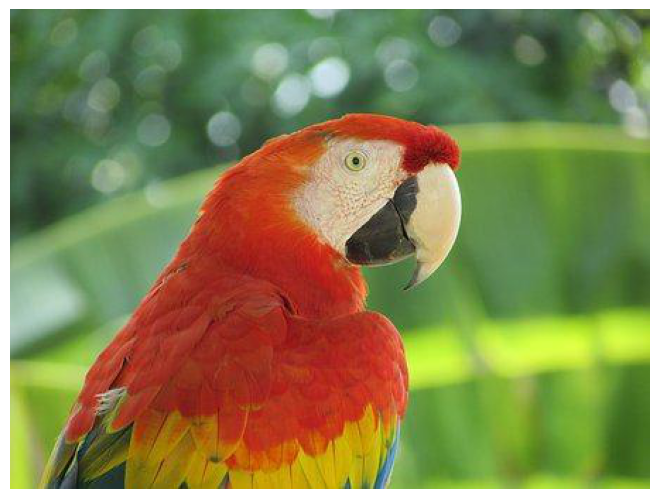

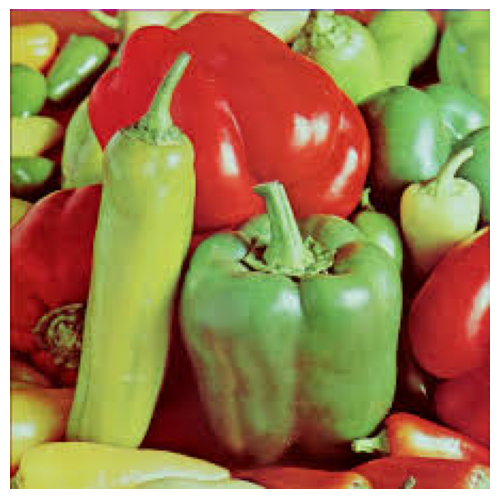

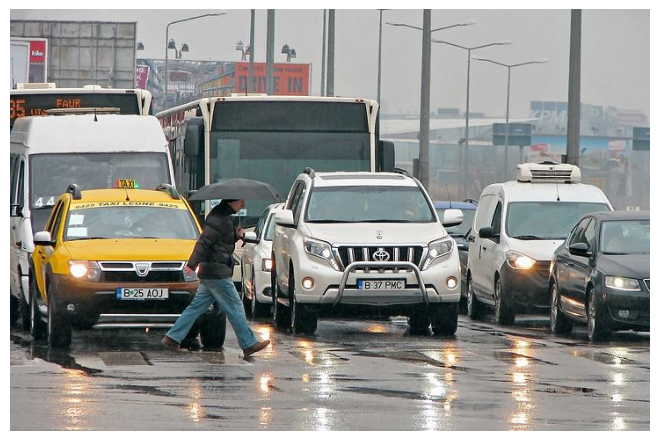

In [4]:
from PIL import Image
import matplotlib.pyplot as plt

# Đường dẫn đến bức ảnh đầu tiên
img_paths = ["../images/parrot.png", "../images/pepper.jpg", "../images/cars.jpg"]
imgs = [Image.open(path) for path in img_paths]

# Display the additional images
for i, image in enumerate(imgs):
    plt.figure(i + 2), plt.clf()
    ax = plt.axes([0, 0, 1, 1])
    plt.axis('off')
    plt.imshow(image)

Ảnh sau xử lý 

C:\Users\Admin\AppData\Local\Temp\ipykernel_15760\1176883867.py:33: UserWarning: The following kwargs were not used by contour: 'contours'
  pylab.subplot(222), pylab.imshow(im), pylab.contour(labels == 0, contours=1, colors='red'), pylab.axis('off')
C:\Users\Admin\AppData\Local\Temp\ipykernel_15760\1176883867.py:44: UserWarning: The following kwargs were not used by contour: 'contours'
  pylab.subplot(224), pylab.imshow(im), pylab.contour(labels == 0, contours=1, colors='red'), pylab.axis('off')


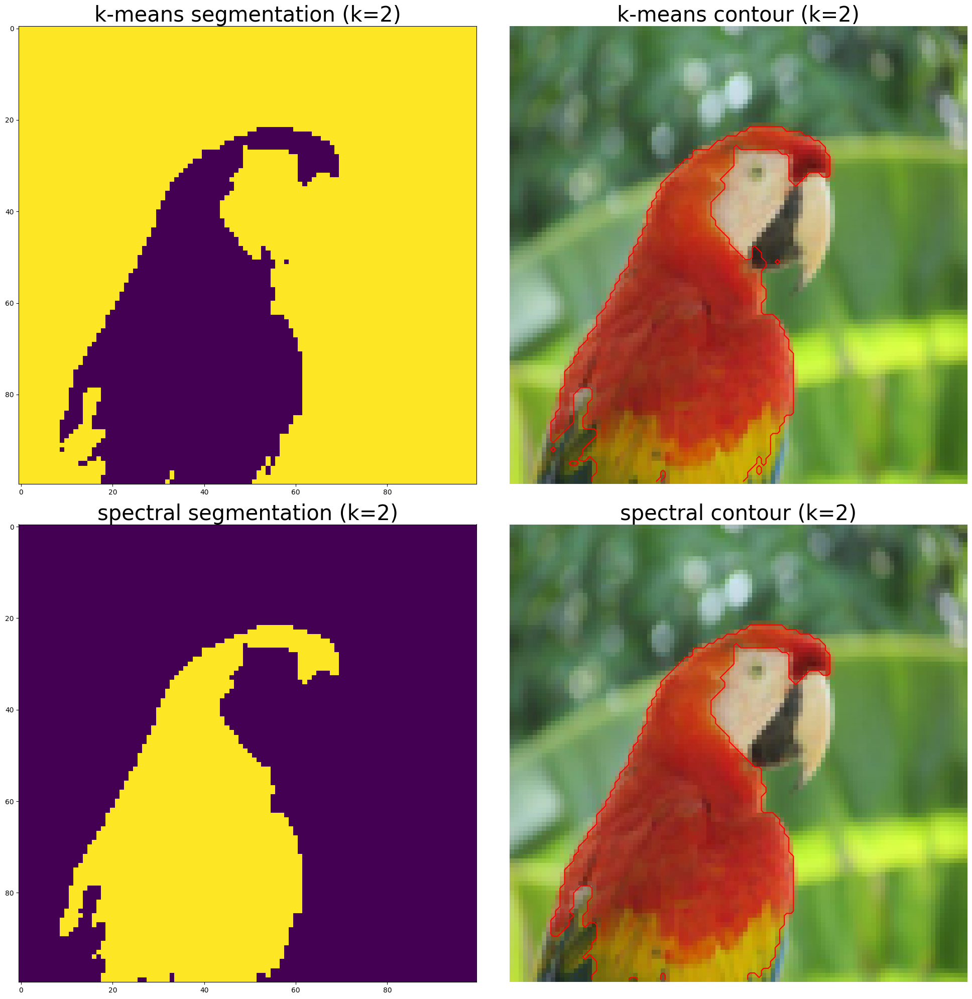

C:\Users\Admin\AppData\Local\Temp\ipykernel_15760\1176883867.py:33: UserWarning: The following kwargs were not used by contour: 'contours'
  pylab.subplot(222), pylab.imshow(im), pylab.contour(labels == 0, contours=1, colors='red'), pylab.axis('off')
C:\Users\Admin\AppData\Local\Temp\ipykernel_15760\1176883867.py:44: UserWarning: The following kwargs were not used by contour: 'contours'
  pylab.subplot(224), pylab.imshow(im), pylab.contour(labels == 0, contours=1, colors='red'), pylab.axis('off')


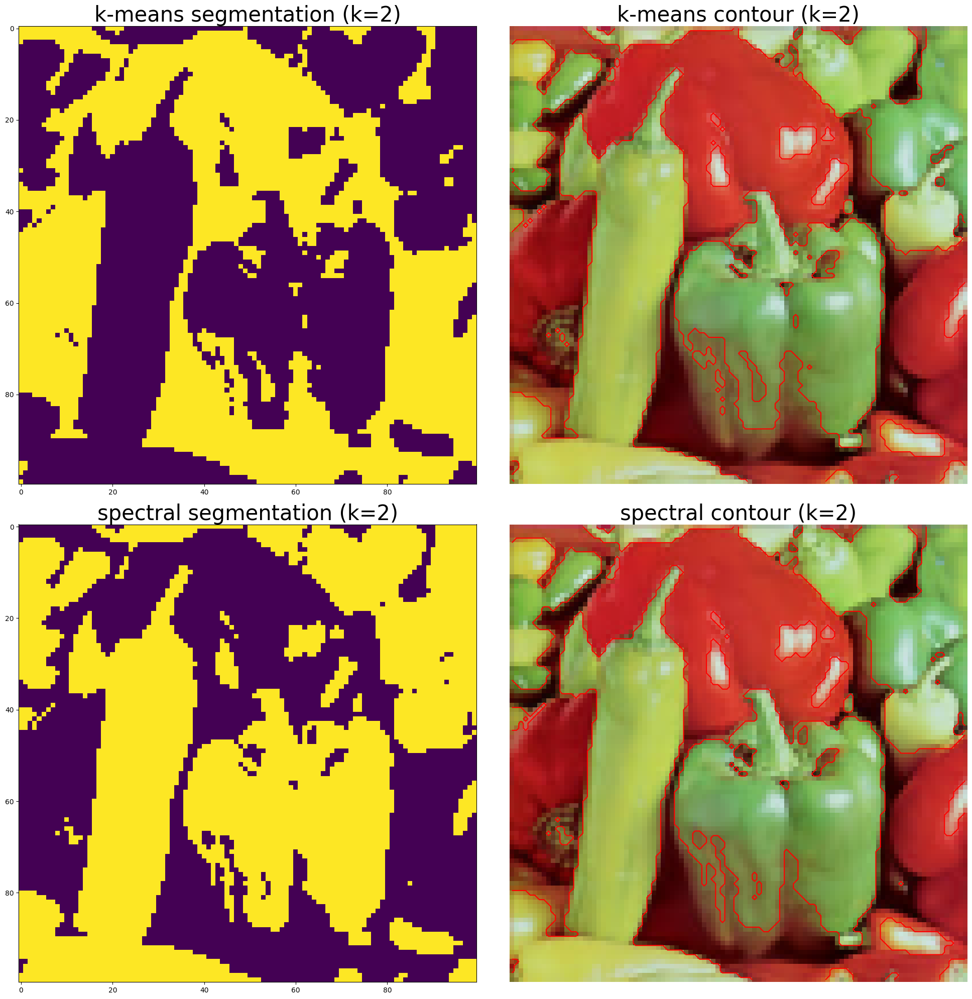

C:\Users\Admin\AppData\Local\Temp\ipykernel_15760\1176883867.py:33: UserWarning: The following kwargs were not used by contour: 'contours'
  pylab.subplot(222), pylab.imshow(im), pylab.contour(labels == 0, contours=1, colors='red'), pylab.axis('off')
C:\Users\Admin\AppData\Local\Temp\ipykernel_15760\1176883867.py:44: UserWarning: The following kwargs were not used by contour: 'contours'
  pylab.subplot(224), pylab.imshow(im), pylab.contour(labels == 0, contours=1, colors='red'), pylab.axis('off')


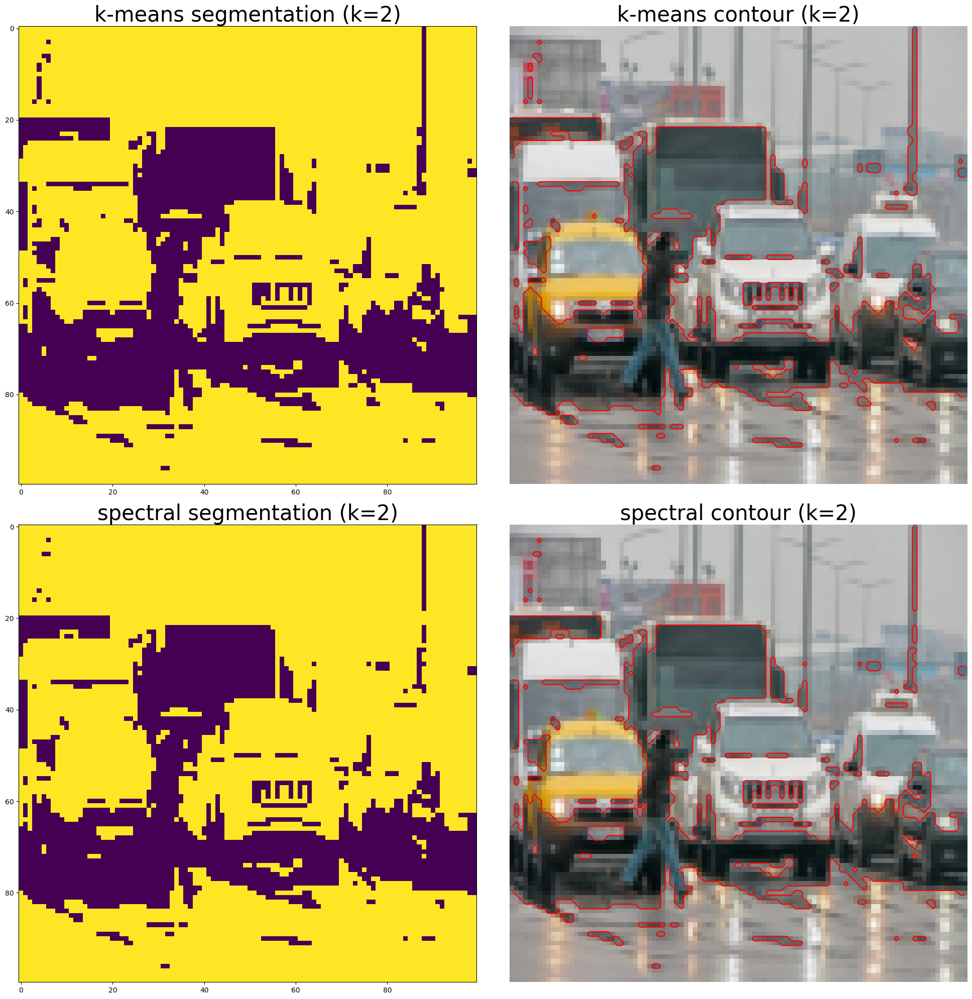

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans, SpectralClustering
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import resize
from PIL import Image
import matplotlib.pylab as pylab

# Đường dẫn đến ảnh đầu vào
img_paths = ["../images/parrot.png", "../images/pepper.jpg", "../images/cars.jpg"]
imgs = [Image.open(path) for path in img_paths]

# Display the additional images
for i, image in enumerate(imgs):
    # Resize and convert image to grayscale
    im = resize(np.array(image), (100, 100, 3))
    img = rgb2gray(im)
    
    # Binary segmentation with 2 output clusters/segments
    k = 2
    X = np.reshape(im, (-1, im.shape[-1]))

    # K-Means segmentation
    two_means = MiniBatchKMeans(n_clusters=k, random_state=10)
    two_means.fit(X)
    y_pred = two_means.predict(X)
    labels = np.reshape(y_pred, im.shape[:2])

    pylab.figure(figsize=(20, 20))
    pylab.subplot(221), pylab.imshow(np.reshape(y_pred, im.shape[:2])),
    pylab.title('k-means segmentation (k=2)', size=30)
    pylab.subplot(222), pylab.imshow(im), pylab.contour(labels == 0, contours=1, colors='red'), pylab.axis('off')
    pylab.title('k-means contour (k=2)', size=30)

    # Spectral Clustering segmentation
    spectral = SpectralClustering(n_clusters=k, eigen_solver='arpack', affinity="nearest_neighbors", n_neighbors=100, random_state=10)
    spectral.fit(X)
    y_pred = spectral.labels_.astype(int)
    labels = np.reshape(y_pred, im.shape[:2])

    pylab.subplot(223), pylab.imshow(np.reshape(y_pred, im.shape[:2])),
    pylab.title('spectral segmentation (k=2)', size=30)
    pylab.subplot(224), pylab.imshow(im), pylab.contour(labels == 0, contours=1, colors='red'), pylab.axis('off')
    pylab.title('spectral contour (k=2)', size=30)
    pylab.tight_layout()
    pylab.show()

# Nhận dạng chữ viết tay

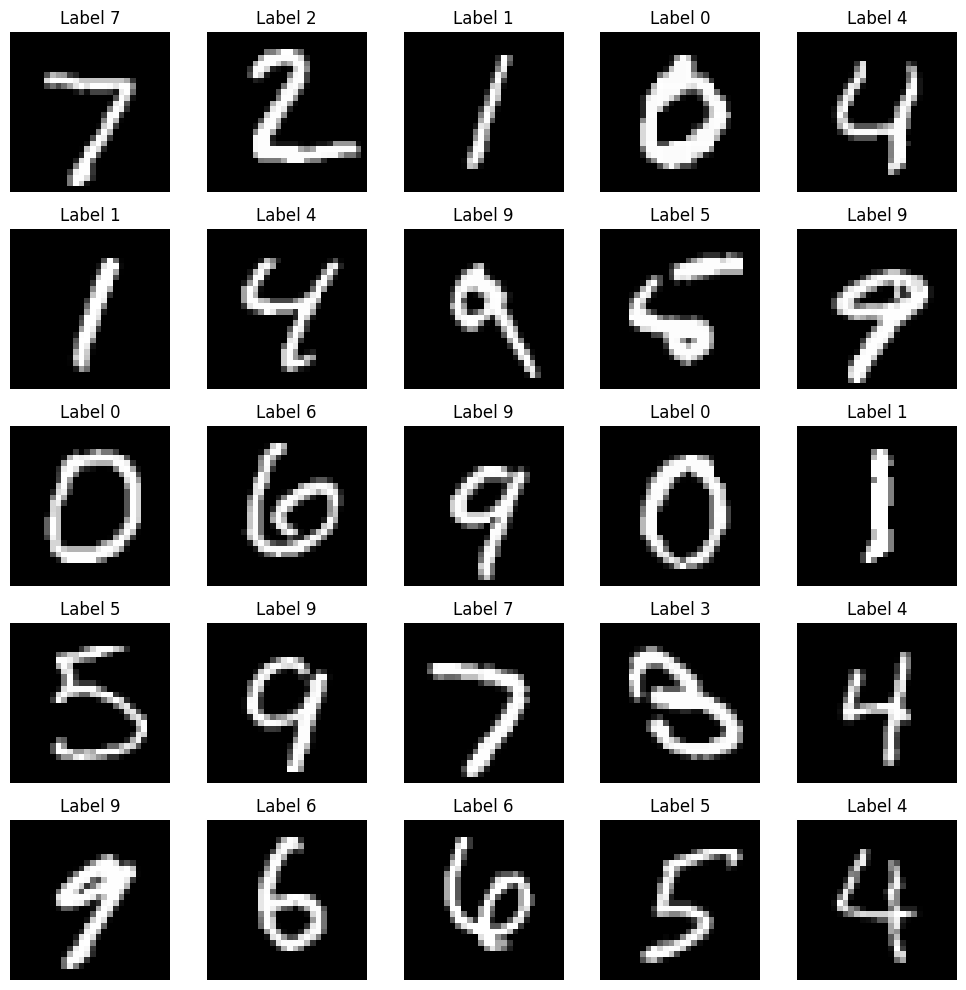

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt 
import gzip, os, sys
import numpy as np
from scipy.stats import multivariate_normal

if sys.version_info[0] == 2:
    from urllib import urlretrieve
else:
    from urllib.request import urlretrieve
    
def load_mnist_images(filename):
    with gzip.open(filename, 'rb') as f:
        data = np.frombuffer(f.read(), np.uint8, offset=16)
    data = data.reshape(-1, 784)
    return data

def load_mnist_labels(filename):
    with gzip.open(filename, 'rb') as f:
        data = np.frombuffer(f.read(), np.uint8, offset=8)
    return data

## Load the training set
train_data = load_mnist_images('./data_handwriting/train-images-idx3-ubyte.gz')
train_labels = load_mnist_labels('./data_handwriting/train-labels-idx1-ubyte.gz')

## Load the testing set
test_data = load_mnist_images('./data_handwriting/t10k-images-idx3-ubyte.gz')
test_labels = load_mnist_labels('./data_handwriting/t10k-labels-idx1-ubyte.gz')

## Define a function that displays a digit given its vector representation
def show_digit(x, label):
    plt.axis('off')
    plt.imshow(x.reshape((28,28)), cmap=plt.cm.gray)
    plt.title('Label ' + str(label))
    #plt.show()
    #return

## Define a function that takes an index into a particular data set ("train" or "test") and displays that image.
def vis_image(index, dataset="train"):
    if(dataset=="train"): 
        label = train_labels[index]
        show_digit(train_data[index,], label)
    else:
        label = test_labels[index]
        show_digit(test_data[index,], label)
    #print("Label " + str(label))
    plt.show()
    return

plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    #show_digit(train_data[i,], train_labels[i])
    show_digit(test_data[i,], test_labels[i])
plt.tight_layout()
plt.show()

In [7]:
import time
from sklearn.neighbors import BallTree
## Build nearest neighbor structure on training data
t_before = time.time()
ball_tree = BallTree(train_data)
t_after = time.time()
## Compute training time
t_training = t_after - t_before
print("Time to build data structure (seconds): ", t_training)
## Get nearest neighbor predictions on testing data
t_before = time.time()
test_neighbors = np.squeeze(ball_tree.query(test_data, k=1, return_distance=False))
test_predictions = train_labels[test_neighbors]
t_after = time.time()
## Compute testing time
t_testing = t_after - t_before
print("Time to classify test set (seconds): ", t_testing)
# evaluate the classifier
t_accuracy = sum(test_predictions == test_labels) / float(len(test_labels))
t_accuracy


Time to build data structure (seconds):  11.360481262207031
Time to classify test set (seconds):  628.3884963989258


np.float64(0.9691)

<Axes: >

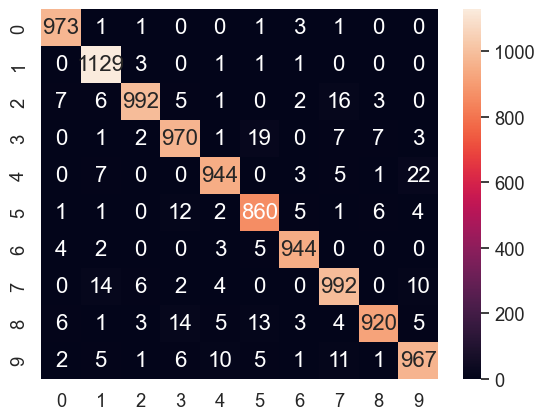

In [9]:
import pandas as pd
import seaborn as sn
from sklearn import metrics
cm = metrics.confusion_matrix(test_labels,test_predictions)
df_cm = pd.DataFrame(cm, range(10), range(10))
sn.set(font_scale=1.2)# for label size
sn.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt="g")

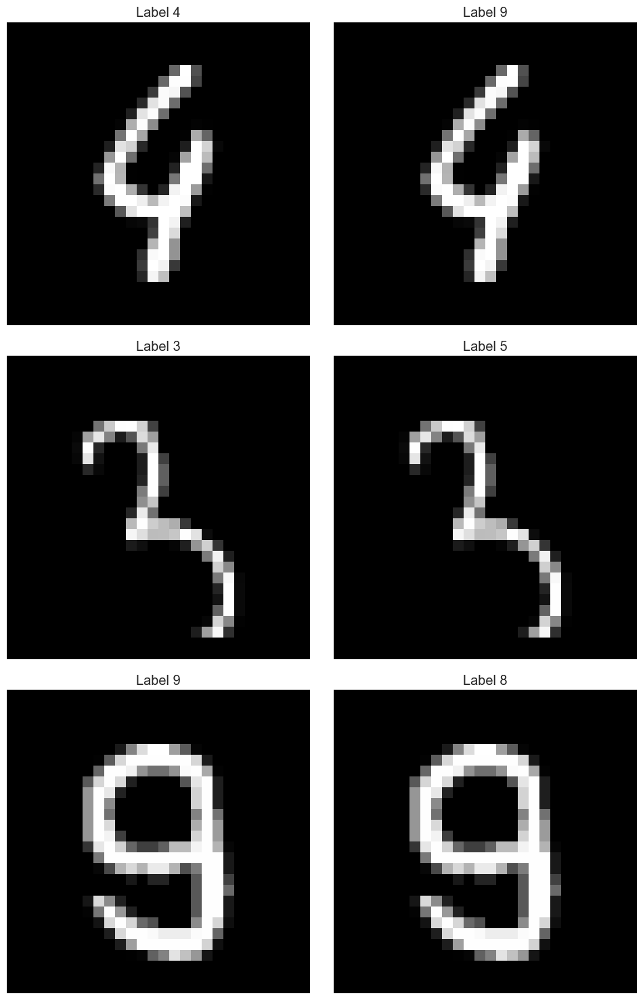

In [18]:
# Find 3 failure case examples
failure_cases = []
for i in range(len(test_labels)):
    if test_predictions[i] != test_labels[i]:
        failure_cases.append((i, test_predictions[i], test_labels[i]))
        if len(failure_cases) == 3:
            break

# Display the failure cases
plt.figure(figsize=(10, 15))
for i, (index, prediction, true_label) in enumerate(failure_cases):
    plt.subplot(3, 2, 2*i + 1)
    show_digit(test_data[index,], true_label)
    plt.subplot(3, 2, 2*i + 2)
    show_digit(test_data[index,], prediction)
plt.tight_layout()
plt.show()